# Task 1 Basics

In [ ]:
# Import necessary libraries
import torch
import torchvision
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import json
import os
from PIL import Image
from tqdm import tqdm

# Check if GPU is available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda:0


In [ ]:
# Mount Google Drive (if not already mounted)
from google.colab import drive
drive.mount('/content/drive')

# Load the labels list from the JSON file
json_path = "/content/drive/MyDrive/ECE7123DL/TestDataSet/labels_list.json"
with open(json_path, 'r') as f:
    labels_list = json.load(f)

# Create a mapping from label index to label name
label_map = {}
for label_entry in labels_list:
    parts = label_entry.split(': ')
    index = int(parts[0])
    label_name = parts[1]
    label_map[index] = label_name

print(f"Loaded {len(label_map)} labels.")

Mounted at /content/drive
Loaded 100 labels.


In [ ]:
# Define the preprocessing transformations
mean_norms = np.array([0.485, 0.456, 0.406])
std_norms = np.array([0.229, 0.224, 0.225])

plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])

# Define the dataset path
dataset_path = "/content/drive/MyDrive/ECE7123DL/TestDataSet"

# Load the dataset
dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=plain_transforms)

# Create a data loader
batch_size = 32
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=False)

print(f"Dataset size: {len(dataset)} images")
print(f"Number of classes: {len(dataset.classes)}")

Dataset size: 500 images
Number of classes: 100


In [ ]:
# Create a mapping from folder names to ImageNet IDs
def create_folder_to_imagenet_mapping():
    # Extract the folder names from your dataset
    folder_names = dataset.classes

    # Create a mapping from folder names to their indices in the dataset
    folder_to_idx = {folder: idx for idx, folder in enumerate(folder_names)}

    # Print the first few entries for debugging
    print("First 5 folder names and their indices:")
    for folder, idx in list(folder_to_idx.items())[:5]:
        print(f"{folder}: {idx}")

    return folder_to_idx

# Create the mapping
folder_to_idx = create_folder_to_imagenet_mapping()

# Function to get the actual ImageNet class ID for each folder
def get_imagenet_id_mapping():
    # The mapping from folder names (like 'n02672831') to actual ImageNet class indices
    folder_name_to_imagenet_id = {}

    # In ImageNet, the folder names are the WordNet IDs
    # We need to use the pretrained model's class indices
    # Let's extract them from the model's class idx file if available

    # We can use a simple approach based on the order of folders in the dataset
    # Assuming the dataset folders are ordered the same way as ImageNet classes
    imagenet_ids = list(range(1000))  # ImageNet has 1000 classes

    # Map each folder to an ImageNet class ID
    for i, folder_name in enumerate(dataset.classes):
        if i < len(imagenet_ids):
            folder_name_to_imagenet_id[folder_name] = imagenet_ids[i]

    return folder_name_to_imagenet_id

# Get the mapping
folder_name_to_imagenet_id = get_imagenet_id_mapping()

First 5 folder names and their indices:
n02672831: 0
n02676566: 1
n02687172: 2
n02690373: 3
n02692877: 4


In [ ]:
pretrained_model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
pretrained_model = pretrained_model.to(device)
# pretrained_model.eval()  # Set the model to evaluation mode

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 190MB/s]


In [ ]:
def evaluate_with_offset_mapping(model, data_loader, device, json_labels):
    """Evaluate the model with the correct mapping between dataset indices and ImageNet indices"""
    model.eval()
    correct_top1 = 0
    correct_top5 = 0
    total = 0

    # Parse the JSON labels to create a mapping from folder index to ImageNet index
    folder_to_imagenet = {}

    # Extract the numeric part from the JSON labels
    for label_entry in json_labels:
        parts = label_entry.split(': ')
        imagenet_idx = int(parts[0])  # This is like 401, 402, etc.
        label_name = parts[1]

        # Map from folder index (0, 1, 2...) to ImageNet index (401, 402, 403...)
        folder_idx = imagenet_idx - 401  # Assuming they're in order
        folder_to_imagenet[folder_idx] = imagenet_idx

    # Print the mapping for the first few classes
    print("Mapping from folder index to ImageNet index:")
    for i in range(5):
        print(f"Folder index {i} -> ImageNet index {folder_to_imagenet.get(i, 'Unknown')}")

    # Evaluate with this mapping
    with torch.no_grad():
        for images, labels in tqdm(data_loader):
            images = images.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(images)

            # Get top predictions
            _, predicted_top1 = torch.max(outputs.data, 1)
            _, predicted_top5 = torch.topk(outputs.data, 5, dim=1)

            # Compare dataset labels to predicted ImageNet indices
            for i in range(labels.size(0)):
                folder_idx = labels[i].item()
                imagenet_idx = folder_to_imagenet.get(folder_idx)

                if imagenet_idx is not None:
                    # Check if the top-1 prediction matches
                    if predicted_top1[i].item() == imagenet_idx:
                        correct_top1 += 1

                    # Check if any of the top-5 predictions match
                    if imagenet_idx in predicted_top5[i].cpu().numpy():
                        correct_top5 += 1

            total += labels.size(0)

    accuracy_top1 = 100 * correct_top1 / total
    accuracy_top5 = 100 * correct_top5 / total

    return accuracy_top1, accuracy_top5

# Load the JSON labels
with open(json_path, 'r') as f:
    json_labels = json.load(f)

# Evaluate with the correct mapping
accuracy_top1, accuracy_top5 = evaluate_with_offset_mapping(pretrained_model, data_loader, device, json_labels)

print(f"\nTop-1 Accuracy: {accuracy_top1:.2f}%")
print(f"Top-5 Accuracy: {accuracy_top5:.2f}%")

Mapping from folder index to ImageNet index:
Folder index 0 -> ImageNet index 401
Folder index 1 -> ImageNet index 402
Folder index 2 -> ImageNet index 403
Folder index 3 -> ImageNet index 404
Folder index 4 -> ImageNet index 405


100%|██████████| 16/16 [01:44<00:00,  6.52s/it]


Top-1 Accuracy: 76.00%
Top-5 Accuracy: 94.20%


# Task 2 Pixel-wise attacks

Task 2: Pixel-wise Attacks using FGSM with epsilon = 0.02
Creating adversarial images...
Processing 16 batches...


100%|██████████| 16/16 [00:04<00:00,  3.78it/s]



Attack success rate: 70.00% (350/500)
Maximum L∞ distance: 0.020000
Average L∞ distance: 0.020000
Epsilon constraint: 0.020000
Visualizing successful adversarial examples...


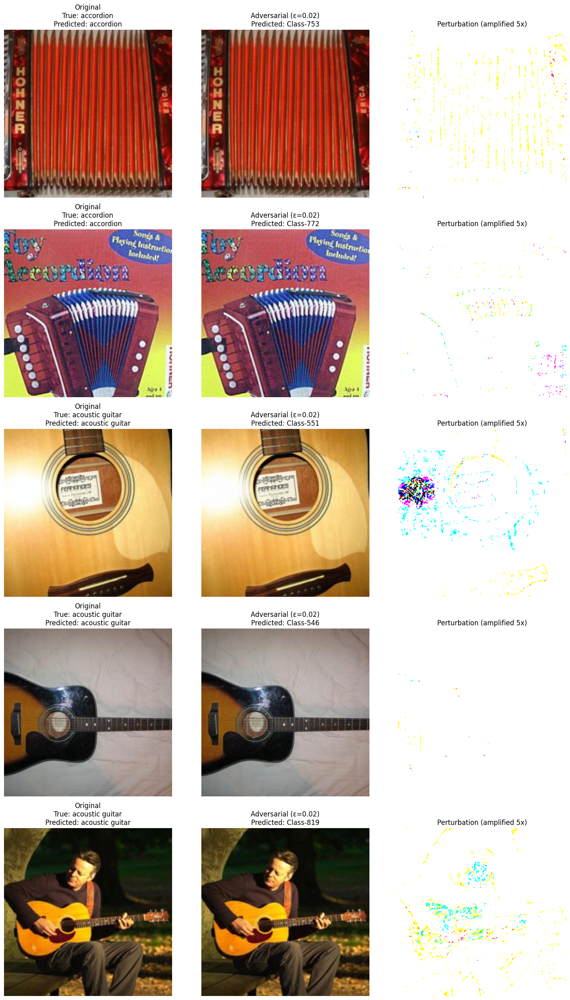


Final Results:
Original Images - Top-1 Accuracy: 76.00%, Top-5 Accuracy: 94.20%
Adversarial Images - Top-1 Accuracy: 6.00%, Top-5 Accuracy: 35.60%
Accuracy Drop - Top-1: 70.00%, Top-5: 58.60%


In [ ]:
def fgsm_attack(model, images, labels, epsilon=0.02, device='cuda'):
    """
    Performs the Fast Gradient Sign Method (FGSM) attack.

    Args:
        model: The neural network model
        images: Input images
        labels: True labels for the images
        epsilon: Attack budget (L∞ constraint)
        device: Device to run the attack on

    Returns:
        Perturbed images
    """
    # Make sure the model is in evaluation mode
    model.eval()

    # Clone the images and enable gradients
    perturbed_images = images.clone().detach().requires_grad_(True)

    # Forward pass
    outputs = model(perturbed_images)

    # Calculate loss
    loss = torch.nn.functional.cross_entropy(outputs, labels)

    # Backward pass
    model.zero_grad()
    loss.backward()

    # Create perturbation using the sign of the gradient
    with torch.no_grad():
        # Get the sign of the gradients
        signed_grad = torch.sign(perturbed_images.grad.data)

        # Create perturbation
        perturbation = epsilon * signed_grad

        # Add perturbation to original images
        perturbed_images = images + perturbation

        # Ensure values stay within valid range
        # Instead of using min/max of batch which can vary, use fixed normalization bounds
        for c in range(3):  # For each channel
            channel_min = (0 - mean_norms[c]) / std_norms[c]
            channel_max = (1 - mean_norms[c]) / std_norms[c]
            perturbed_images[:, c] = torch.clamp(perturbed_images[:, c], min=channel_min, max=channel_max)

    return perturbed_images

def create_and_evaluate_adversarial_dataset(model, data_loader, epsilon=0.02, device='cuda', save_dir='./AdversarialTestSet1', num_vis_examples=5):
    """
    Creates an adversarial dataset using FGSM and evaluates model performance.

    Args:
        model: The neural network model
        data_loader: DataLoader for the test set
        epsilon: Attack budget
        device: Device to run the attack on
        save_dir: Directory to save adversarial images
        num_vis_examples: Number of examples to collect for visualization

    Returns:
        visualization_examples, original_accuracy, adversarial_accuracy
    """
    model.eval()

    # Create required directories
    os.makedirs(save_dir, exist_ok=True)

    # Parse label mapping
    # Assuming labels_list is a list of strings in the format "401: accordion"
    # Create a mapping from ImageNet index to label name
    global label_map  # Make it accessible to other functions
    label_map = {}
    folder_to_imagenet = {}

    # Parse label mapping from json file content (from uploaded file)
    for label_entry in labels_list:
        parts = label_entry.split(': ')
        imagenet_idx = int(parts[0])
        label_name = parts[1]
        label_map[imagenet_idx] = label_name

        # Assuming folder indices are 0-indexed and correspond to ImageNet indices 401, 402, ...
        folder_idx = imagenet_idx - 401
        folder_to_imagenet[folder_idx] = imagenet_idx

    # Storage for evaluation
    all_original_images = []
    all_perturbed_images = []
    all_labels = []

    # For visualization
    vis_examples = []

    # Counter for successful attacks
    total_images = 0
    successful_attacks = 0

    print(f"Processing {len(data_loader)} batches...")

    # Process each batch
    for batch_idx, (images, labels) in enumerate(tqdm(data_loader)):
        images, labels = images.to(device), labels.to(device)

        # Map folder indices to ImageNet indices
        imagenet_labels = torch.tensor([folder_to_imagenet.get(label.item(), -1) for label in labels]).to(device)

        # Forward pass to get original predictions
        with torch.no_grad():
            outputs = model(images)
            _, original_preds = torch.max(outputs, 1)
            _, original_top5 = torch.topk(outputs, 5, dim=1)

        # Create adversarial examples
        perturbed_images = fgsm_attack(model, images, imagenet_labels, epsilon, device)

        # Get predictions for perturbed images
        with torch.no_grad():
            perturbed_outputs = model(perturbed_images)
            _, perturbed_preds = torch.max(perturbed_outputs, 1)
            _, perturbed_top5 = torch.topk(perturbed_outputs, 5, dim=1)

        # Save images and update counters
        for i in range(images.size(0)):
            # Skip if label mapping failed
            if imagenet_labels[i].item() == -1:
                continue

            # Store for evaluation
            all_original_images.append(images[i].cpu())
            all_perturbed_images.append(perturbed_images[i].cpu())
            all_labels.append(imagenet_labels[i].item())

            # Check if attack was successful (original correct, perturbed wrong)
            original_correct = (original_preds[i].item() == imagenet_labels[i].item())
            perturbed_correct = (perturbed_preds[i].item() == imagenet_labels[i].item())

            # Count successful attacks
            total_images += 1
            if original_correct and not perturbed_correct:
                successful_attacks += 1

                # Store for visualization if we need more examples
                if len(vis_examples) < num_vis_examples:
                    vis_examples.append({
                        'original': images[i].cpu(),
                        'perturbed': perturbed_images[i].cpu(),
                        'perturbation': perturbed_images[i].cpu() - images[i].cpu(),
                        'original_pred': original_preds[i].item(),
                        'perturbed_pred': perturbed_preds[i].item(),
                        'true_label': imagenet_labels[i].item(),
                        'label_name': label_map.get(imagenet_labels[i].item(), 'Unknown')
                    })

            # Save each perturbed image in the dataset structure
            img_class = data_loader.dataset.classes[labels[i].item()]
            os.makedirs(os.path.join(save_dir, img_class), exist_ok=True)

            # Get original filename from the dataset
            img_idx = batch_idx * data_loader.batch_size + i
            if img_idx < len(data_loader.dataset.imgs):  # Make sure index is in range
                img_path = data_loader.dataset.imgs[img_idx][0]
                img_name = os.path.basename(img_path)

                # Convert tensor to PIL image for saving
                perturbed_img = perturbed_images[i].cpu().clone()
                perturbed_img = perturbed_img * torch.tensor(std_norms).view(3, 1, 1) + torch.tensor(mean_norms).view(3, 1, 1)
                perturbed_img = torch.clamp(perturbed_img, 0, 1)
                perturbed_img = transforms.ToPILImage()(perturbed_img)

                # Save the perturbed image
                save_path = os.path.join(save_dir, img_class, img_name)
                perturbed_img.save(save_path)
            else:
                print(f"Warning: Image index {img_idx} out of range.")

    # Print attack success rate
    attack_success_rate = (successful_attacks / total_images) * 100 if total_images > 0 else 0
    print(f"\nAttack success rate: {attack_success_rate:.2f}% ({successful_attacks}/{total_images})")

    # Verify L∞ constraint
    max_dist, avg_dist = verify_linf_constraint(all_original_images, all_perturbed_images, epsilon)
    print(f"Maximum L∞ distance: {max_dist:.6f}")
    print(f"Average L∞ distance: {avg_dist:.6f}")
    print(f"Epsilon constraint: {epsilon:.6f}")

    # Evaluate original and adversarial accuracies
    original_acc = evaluate_model_on_images(model, all_original_images, all_labels, device)
    adversarial_acc = evaluate_model_on_images(model, all_perturbed_images, all_labels, device)

    return vis_examples, original_acc, adversarial_acc

def verify_linf_constraint(original_images, perturbed_images, epsilon):
    """
    Verifies that the L∞ distance between original and perturbed images
    is no greater than epsilon.

    Returns:
        max_dist, avg_dist
    """
    max_dist = 0.0
    all_dists = []

    for orig_img, pert_img in zip(original_images, perturbed_images):
        # Calculate L∞ distance
        dist = torch.max(torch.abs(orig_img - pert_img)).item()
        max_dist = max(max_dist, dist)
        all_dists.append(dist)

    avg_dist = sum(all_dists) / len(all_dists)
    return max_dist, avg_dist

def evaluate_model_on_images(model, images, labels, device='cuda'):
    """
    Evaluates model performance (top-1 and top-5 accuracy) on a list of images.

    Returns:
        (top1_accuracy, top5_accuracy)
    """
    model.eval()
    correct_top1 = 0
    correct_top5 = 0
    total = 0

    # Batch size for evaluation
    batch_size = 32
    num_batches = (len(images) + batch_size - 1) // batch_size

    with torch.no_grad():
        for i in range(num_batches):
            # Get batch indices
            start_idx = i * batch_size
            end_idx = min((i + 1) * batch_size, len(images))

            # Create batch tensors
            batch_images = torch.stack([images[j] for j in range(start_idx, end_idx)]).to(device)
            batch_labels = [labels[j] for j in range(start_idx, end_idx)]

            # Forward pass
            outputs = model(batch_images)

            # Get top predictions
            _, predicted_top1 = torch.max(outputs.data, 1)
            _, predicted_top5 = torch.topk(outputs.data, 5, dim=1)

            # Compare predictions to true labels
            for j in range(len(batch_labels)):
                true_label = batch_labels[j]

                # Check top-1 accuracy
                if predicted_top1[j].item() == true_label:
                    correct_top1 += 1

                # Check top-5 accuracy
                if true_label in predicted_top5[j].cpu().numpy():
                    correct_top5 += 1

            total += len(batch_labels)

    accuracy_top1 = 100 * correct_top1 / total
    accuracy_top5 = 100 * correct_top5 / total

    return accuracy_top1, accuracy_top5

def get_imagenet_class_names():
    """
    Get class names for all 1000 ImageNet classes.
    Returns a dictionary mapping class indices to class names.
    """
    # For the 100 classes in our test set, we already have names in label_map
    full_label_map = {}

    # Copy our known labels (from the test set)
    for idx, name in label_map.items():
        full_label_map[idx] = name

    # For classes outside our test set, we'll use a simplified name
    # This ensures we don't get "Unknown" for adversarial predictions
    for i in range(1, 1001):
        if i not in full_label_map:
            full_label_map[i] = f"Class-{i}"

    return full_label_map

def visualize_adversarial_examples(examples, epsilon):
    """
    Creates a high-quality visualization of adversarial examples.
    Shows original image, perturbed image, and difference (amplified for visibility).
    """
    num_examples = len(examples)
    fig, axes = plt.subplots(num_examples, 3, figsize=(15, 5 * num_examples))

    if num_examples == 1:
        axes = axes.reshape(1, -1)

    # Get full ImageNet class names
    full_label_map = get_imagenet_class_names()

    for i, example in enumerate(examples):
        # Get images
        orig_img = example['original']
        pert_img = example['perturbed']

        # Denormalize for visualization
        orig_img = orig_img * torch.tensor(std_norms).view(3, 1, 1) + torch.tensor(mean_norms).view(3, 1, 1)
        orig_img = torch.clamp(orig_img, 0, 1)

        pert_img = pert_img * torch.tensor(std_norms).view(3, 1, 1) + torch.tensor(mean_norms).view(3, 1, 1)
        pert_img = torch.clamp(pert_img, 0, 1)

        # Convert to numpy arrays for visualization
        orig_img_np = orig_img.permute(1, 2, 0).numpy()
        pert_img_np = pert_img.permute(1, 2, 0).numpy()

        # Calculate the difference and amplify it for visibility
        diff_img = np.abs(pert_img_np - orig_img_np)
        diff_img = diff_img / (diff_img.max() + 1e-8) * 5  # Amplify by factor of 5 for visibility
        diff_img = np.clip(diff_img, 0, 1)  # Clip to valid range

        # Get class names and predictions
        true_label = example['label_name']
        orig_pred = full_label_map.get(example['original_pred'], f"Class-{example['original_pred']}")
        pert_pred = full_label_map.get(example['perturbed_pred'], f"Class-{example['perturbed_pred']}")

        # Plot original image
        axes[i, 0].imshow(orig_img_np)
        axes[i, 0].set_title(f"Original\nTrue: {true_label}\nPredicted: {orig_pred}")
        axes[i, 0].axis('off')

        # Plot perturbed image
        axes[i, 1].imshow(pert_img_np)
        axes[i, 1].set_title(f"Adversarial (ε={epsilon})\nPredicted: {pert_pred}")
        axes[i, 1].axis('off')

        # Plot difference
        axes[i, 2].imshow(diff_img)
        axes[i, 2].set_title(f"Perturbation (amplified 5x)")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.savefig('adversarial_examples.png', dpi=300)
    plt.show()

def execute_task2(model, data_loader, epsilon=0.02, device='cuda', save_dir='./AdversarialTestSet1'):
    """
    Execute Task 2: Create adversarial examples using FGSM and evaluate.
    """
    print(f"Task 2: Pixel-wise Attacks using FGSM with epsilon = {epsilon}")
    print("Creating adversarial images...")

    # Create and evaluate adversarial dataset
    vis_examples, original_acc, adversarial_acc = create_and_evaluate_adversarial_dataset(
        model, data_loader, epsilon, device, save_dir
    )

    # Visualize examples
    if vis_examples:
        print("Visualizing successful adversarial examples...")
        visualize_adversarial_examples(vis_examples, epsilon)
    else:
        print("No successful adversarial examples found for visualization.")

    # Print final results
    print("\nFinal Results:")
    print(f"Original Images - Top-1 Accuracy: {original_acc[0]:.2f}%, Top-5 Accuracy: {original_acc[1]:.2f}%")
    print(f"Adversarial Images - Top-1 Accuracy: {adversarial_acc[0]:.2f}%, Top-5 Accuracy: {adversarial_acc[1]:.2f}%")
    print(f"Accuracy Drop - Top-1: {original_acc[0] - adversarial_acc[0]:.2f}%, Top-5: {original_acc[1] - adversarial_acc[1]:.2f}%")
    # print(f"Relative Accuracy Drop - Top-1: {((original_acc[0] - adversarial_acc[0]) / original_acc[0]) * 100:.2f}%, Top-5: {((original_acc[1] - adversarial_acc[1]) / original_acc[1]) * 100:.2f}%")

    return original_acc, adversarial_acc, vis_examples

# Example usage:
epsilon = 0.02
save_dir = "./AdversarialTestSet1"
original_acc, adversarial_acc, vis_examples = execute_task2(pretrained_model, data_loader, epsilon, device, save_dir)

# Task 3 Improved attacks
with Projected Gradient Descent (PGD)

Task 3: Improved Attacks using Targeted PGD with epsilon = 0.02, alpha = 0.0025, iterations = 40
Creating adversarial images...
Processing 16 batches with PGD attack (epsilon=0.02, alpha=0.0025, iterations=40)...


100%|██████████| 16/16 [01:27<00:00,  5.47s/it]



Attack success rate: 76.00% (380/500)
Maximum L∞ distance: 0.020000
Average L∞ distance: 0.020000
Epsilon constraint: 0.020000
Visualizing successful adversarial examples...


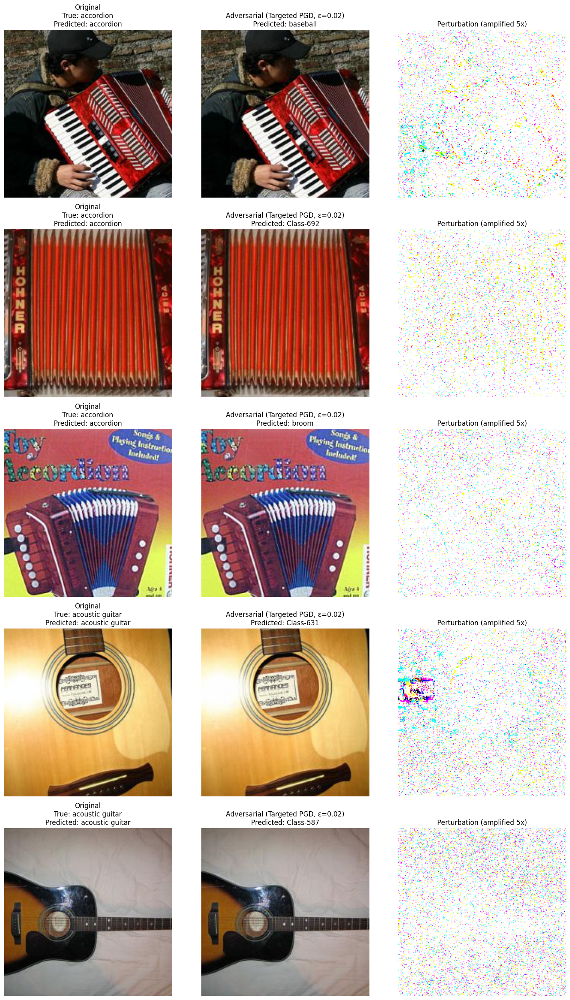


Final Results:
Original Images - Top-1 Accuracy: 76.00%, Top-5 Accuracy: 94.20%
Adversarial Images - Top-1 Accuracy: 0.00%, Top-5 Accuracy: 1.00%
Accuracy Drop - Top-1: 76.00%, Top-5: 93.20%


In [ ]:
def margin_loss(outputs, true_labels, target_labels=None):
    # Get the logits for the true class
    batch_size = outputs.size(0)
    true_class_logits = outputs[torch.arange(batch_size), true_labels]

    if target_labels is not None:
        # Targeted attack: maximize margin between target and true class
        target_class_logits = outputs[torch.arange(batch_size), target_labels]
        # We want: target_logits > true_logits by as much as possible
        return torch.mean(true_class_logits - target_class_logits)
    else:
        # Untargeted attack: minimize true class logit vs all others
        other_logits = outputs.clone()
        # Set true class logits to a very low value so they're ignored in the max operation
        other_logits[torch.arange(batch_size), true_labels] = -float('inf')
        # Get the highest non-true class logit
        best_other_logits = torch.max(other_logits, dim=1)[0]
        # We want: other_logits > true_logits by as much as possible
        return torch.mean(true_class_logits - best_other_logits)

def confidence_weighted_loss(outputs, true_labels, target_labels=None, kappa=20.0):
    # Get probabilities
    probs = torch.nn.functional.softmax(outputs, dim=1)
    batch_size = outputs.size(0)

    # Get confidence in true class
    true_class_confidence = probs[torch.arange(batch_size), true_labels]

    if target_labels is not None:
        # Targeted: maximize target confidence, minimize true confidence
        target_class_confidence = probs[torch.arange(batch_size), target_labels]
        # Weight by how confident the model is in the true class
        # The more confident it is, the harder we should attack
        confidence_weights = torch.pow(true_class_confidence, 2)
        return torch.mean((true_class_confidence - target_class_confidence) * confidence_weights * kappa)
    else:
        # Untargeted: minimize true confidence
        # Weight loss more for confident predictions
        confidence_weights = torch.pow(true_class_confidence, 2)
        return torch.mean(true_class_confidence * confidence_weights * kappa)

def entropy_loss(outputs, true_labels, target_labels=None, lambda_entropy=0.5):
    # Standard classification loss
    standard_loss = torch.nn.functional.cross_entropy(outputs, true_labels)

    # Calculate entropy of the softmax distribution
    probs = torch.nn.functional.softmax(outputs, dim=1)
    log_probs = torch.nn.functional.log_softmax(outputs, dim=1)
    entropy = -torch.sum(probs * log_probs, dim=1).mean()

    if target_labels is not None:
        # For targeted attacks, we want to minimize entropy for target class
        target_loss = -torch.nn.functional.cross_entropy(outputs, target_labels)
        # Balance between increasing entropy overall and targeting specific class
        return target_loss - lambda_entropy * entropy
    else:
        # For untargeted attacks, maximize entropy (uncertainty)
        return standard_loss - lambda_entropy * entropy

def multi_target_loss(outputs, true_labels, num_targets=3):
    batch_size = outputs.size(0)
    num_classes = outputs.size(1)

    # Get the logits for the true class
    true_class_logits = outputs[torch.arange(batch_size), true_labels]

    # Create a mask to exclude the true class when finding top targets
    mask = torch.ones((batch_size, num_classes), device=outputs.device)
    mask[torch.arange(batch_size), true_labels] = 0

    # Find the top-k most likely incorrect classes
    masked_outputs = outputs * mask - (1 - mask) * 10000.0  # Large negative for true class
    _, target_indices = torch.topk(masked_outputs, num_targets, dim=1)

    # Calculate the margin loss for each target class
    total_loss = 0
    for i in range(num_targets):
        target_logits = outputs[torch.arange(batch_size), target_indices[:, i]]
        total_loss += torch.mean(true_class_logits - target_logits)

    return total_loss / num_targets

# def class_weighted_loss(outputs, true_labels, class_weights=None):
#     """Apply different weights to different classes based on difficulty"""
#     if class_weights is None:
#         # Default: all classes equally weighted
#         class_weights = torch.ones(1000, device=outputs.device)

#     batch_size = outputs.size(0)
#     # Get the weights for each sample's true class
#     weights = class_weights[true_labels]

#     # Calculate standard cross-entropy loss
#     loss = torch.nn.functional.cross_entropy(outputs, true_labels, reduction='none')

#     # Apply class-specific weights
#     weighted_loss = loss * weights
#     return weighted_loss.mean()

def pgd_attack(model, images, labels, epsilon=0.02, alpha=0.005, num_iter=20, random_start=True, target=None, device='cuda', use_adaptive_step=True, ensemble_size=5):
    """
    Performs enhanced Projected Gradient Descent (PGD) attack with adaptive step size and ensemble targets.

    Args:
        model: The neural network model
        images: Input images
        labels: True labels for the images
        epsilon: Attack budget (L∞ constraint)
        alpha: Initial step size for each iteration
        num_iter: Number of iterations
        random_start: Whether to start with a random perturbation
        target: Target labels for targeted attack (None for untargeted)
        device: Device to run the attack on
        use_adaptive_step: Whether to adaptively reduce step size
        ensemble_size: Number of targets to try (for ensemble approach)

    Returns:
        Perturbed images
    """
    # Make sure the model is in evaluation mode
    model.eval()

    # If using ensemble of targets, we'll keep track of best adversarial examples
    if target is not None and ensemble_size > 1:
        # Get initial predictions on clean images to measure effectiveness
        with torch.no_grad():
            initial_outputs = model(images)
            # Get top predictions for clean images
            _, initial_top5 = torch.topk(initial_outputs, 5, dim=1)

        # Track best adversarial examples (lowest confidence in true class)
        best_adv_images = None
        best_confidences = torch.ones(images.size(0)).to(device) * float('inf')

        # Try different targets for each image
        for e in range(ensemble_size):
            # Generate new random targets for this ensemble run
            if e == 0:
                # First run - use provided targets
                current_targets = target
            else:
                # Subsequent runs - generate new random targets (least likely classes)
                with torch.no_grad():
                    # Get least likely classes for each image (avoid using true class or previous targets)
                    current_targets = torch.zeros_like(labels)
                    for i in range(images.size(0)):
                        # Get probabilities
                        probs = torch.nn.functional.softmax(initial_outputs[i], dim=0)
                        # Set the true class and top-5 to have high probability, so they're not chosen
                        for k in range(5):
                            if initial_top5[i, k] == labels[i]:
                                continue
                            else:
                                probs[initial_top5[i, k]] = 1.0

                        # Choose a target different from the true label
                        _, indices = torch.sort(probs)
                        for idx in indices:
                            if idx.item() != labels[i].item():
                                current_targets[i] = idx
                                break

            # Run PGD with current targets
            current_adv_images = _pgd_single_run(model, images, labels, epsilon, alpha, num_iter,
                                                random_start, current_targets, device, use_adaptive_step)

            # Evaluate effectiveness - lower confidence in true class is better
            with torch.no_grad():
                current_outputs = model(current_adv_images)
                current_confidences = torch.nn.functional.softmax(current_outputs, dim=1)

                # Get confidence in true class
                true_class_confidences = torch.zeros(images.size(0))
                for i in range(images.size(0)):
                    true_class_confidences[i] = current_confidences[i, labels[i]].item()

                # Update best adversarial examples where this run is better
                for i in range(images.size(0)):
                    if true_class_confidences[i] < best_confidences[i]:
                        if best_adv_images is None:
                            best_adv_images = current_adv_images.clone()
                        else:
                            best_adv_images[i] = current_adv_images[i].clone()
                        best_confidences[i] = true_class_confidences[i]

        # Return the best adversarial examples across all ensemble runs
        return best_adv_images if best_adv_images is not None else current_adv_images
    else:
        # If not using ensemble, just run PGD once
        return _pgd_single_run(model, images, labels, epsilon, alpha, num_iter, random_start, target, device, use_adaptive_step)

def _pgd_single_run(model, images, labels, epsilon, alpha, num_iter, random_start, target, device, use_adaptive_step):
    """Helper function to run a single PGD attack"""
    # Clone the images
    perturbed_images = images.clone().detach()

    # Start with random perturbation if specified
    if random_start:
        # Random perturbation within epsilon
        random_noise = torch.FloatTensor(images.shape).uniform_(-epsilon, epsilon).to(device)
        perturbed_images = perturbed_images + random_noise
        # Project back to valid image range (considering normalization)
        for c in range(3):  # For each channel
            channel_min = (0 - mean_norms[c]) / std_norms[c]
            channel_max = (1 - mean_norms[c]) / std_norms[c]
            perturbed_images[:, c] = torch.clamp(perturbed_images[:, c], min=channel_min, max=channel_max)

    # Iterate for num_iter iterations
    for i in range(num_iter):
        # Adaptive step size calculation
        if use_adaptive_step:
            # Gradually reduce step size for better convergence
            current_alpha = alpha * (1 - 0.75 * i / num_iter)
        else:
            current_alpha = alpha

        # Set requires_grad for perturbed images
        perturbed_images.requires_grad = True

        # Forward pass
        outputs = model(perturbed_images)

        # Calculate loss using enhanced loss functions
        if target is not None:
            # For targeted attacks, use margin loss
            loss = margin_loss(outputs, labels, target)
            # Optionally add entropy component
            entropy = entropy_loss(outputs, labels, target)
            loss = loss + 0.5 * entropy
        else:
            # For untargeted attacks, use multi-target approach
            loss = multi_target_loss(outputs, labels, num_targets=3)
            # Add confidence weighting
            conf_loss = confidence_weighted_loss(outputs, labels)
            loss = loss + 0.7 * conf_loss

        # Backward pass
        model.zero_grad()
        loss.backward()

        # Get the gradient's sign
        with torch.no_grad():
            signed_grad = torch.sign(perturbed_images.grad.data)

            # Update perturbed images with the step size
            if target is not None:
                # For targeted attack, move in negative gradient direction
                perturbed_images = perturbed_images - current_alpha * signed_grad
            else:
                # For untargeted attack, move in positive gradient direction
                perturbed_images = perturbed_images + current_alpha * signed_grad

            # Project back to epsilon ball around original images
            delta = torch.clamp(perturbed_images - images, min=-epsilon, max=epsilon)
            perturbed_images = images + delta

            # Project back to valid image range
            for c in range(3):  # For each channel
                channel_min = (0 - mean_norms[c]) / std_norms[c]
                channel_max = (1 - mean_norms[c]) / std_norms[c]
                perturbed_images[:, c] = torch.clamp(perturbed_images[:, c], min=channel_min, max=channel_max)

    return perturbed_images

def create_and_evaluate_pgd_adversarial_dataset(model, data_loader, epsilon=0.02, alpha=0.005, num_iter=20,
                                               random_start=True, targeted=True, device='cuda',
                                               save_dir='./AdversarialTestSet2', num_vis_examples=5,
                                               use_adaptive_step=True, ensemble_size=3):
    """
    Creates an adversarial dataset using PGD and evaluates model performance.

    Args:
        model: The neural network model
        data_loader: DataLoader for the test set
        epsilon: Attack budget
        alpha: Step size for each iteration
        num_iter: Number of iterations
        random_start: Whether to start with a random perturbation
        targeted: Whether to use a targeted attack
        device: Device to run the attack on
        save_dir: Directory to save adversarial images
        num_vis_examples: Number of examples to collect for visualization

    Returns:
        visualization_examples, original_accuracy, adversarial_accuracy
    """
    model.eval()

    # Create required directories
    os.makedirs(save_dir, exist_ok=True)

    # Parse label mapping
    # Assuming labels_list is a list of strings in the format "401: accordion"
    # Create a mapping from ImageNet index to label name
    global label_map  # Make it accessible to other functions
    label_map = {}
    folder_to_imagenet = {}

    # Parse label mapping from json file content
    with open("/content/drive/MyDrive/ECE7123DL/TestDataSet/labels_list.json", 'r') as f:
        labels_list = json.load(f)

    for label_entry in labels_list:
        parts = label_entry.split(': ')
        imagenet_idx = int(parts[0])
        label_name = parts[1]
        label_map[imagenet_idx] = label_name

        # Assuming folder indices are 0-indexed and correspond to ImageNet indices 401, 402, ...
        folder_idx = imagenet_idx - 401
        folder_to_imagenet[folder_idx] = imagenet_idx

    # Storage for evaluation
    all_original_images = []
    all_perturbed_images = []
    all_labels = []

    # For visualization
    vis_examples = []

    # Counter for successful attacks
    total_images = 0
    successful_attacks = 0

    print(f"Processing {len(data_loader)} batches with PGD attack (epsilon={epsilon}, alpha={alpha}, iterations={num_iter})...")

    # Process each batch
    for batch_idx, (images, labels) in enumerate(tqdm(data_loader)):
        images, labels = images.to(device), labels.to(device)

        # Map folder indices to ImageNet indices
        imagenet_labels = torch.tensor([folder_to_imagenet.get(label.item(), -1) for label in labels]).to(device)

        # Forward pass to get original predictions
        with torch.no_grad():
            outputs = model(images)
            _, original_preds = torch.max(outputs, 1)
            _, original_top5 = torch.topk(outputs, 5, dim=1)

        # Create target labels for targeted attack if needed
        target_labels = None
        if targeted:
            with torch.no_grad():
                # Get the probability distribution
                softmax_probs = torch.nn.functional.softmax(outputs, dim=1)

                # Strategy: target classes that are semantically confusable
                # For each image, find classes with mid-range probabilities (not highest, not lowest)
                # These are classes the model slightly confuses with the true class
                _, sorted_indices = torch.sort(softmax_probs, dim=1, descending=True)

                # Choose targets from positions 5-15 in the sorted probabilities
                # These are classes the model thinks are somewhat plausible
                confusable_position = 10  # Can be tuned between 5-15
                target_indices = []

                for i, true_label in enumerate(imagenet_labels):
                    # Ensure the target is different from the true label
                    candidate_position = confusable_position
                    while candidate_position < softmax_probs.size(1):
                        candidate = sorted_indices[i, candidate_position].item()
                        if candidate != true_label.item():
                            target_indices.append(candidate)
                            break
                        candidate_position += 1

                    # Fallback if no suitable target found
                    if candidate_position >= softmax_probs.size(1):
                        # Choose second most likely prediction if different from true label
                        if sorted_indices[i, 1].item() != true_label.item():
                            target_indices.append(sorted_indices[i, 1].item())
                        else:
                            target_indices.append(sorted_indices[i, 2].item())

                target_labels = torch.tensor(target_indices).to(device)

        # Create adversarial examples
        perturbed_images = pgd_attack(model, images, imagenet_labels, epsilon, alpha, num_iter,
                                     random_start, target_labels, device)

        # Get predictions for perturbed images
        with torch.no_grad():
            perturbed_outputs = model(perturbed_images)
            _, perturbed_preds = torch.max(perturbed_outputs, 1)
            _, perturbed_top5 = torch.topk(perturbed_outputs, 5, dim=1)

        # Save images and update counters
        for i in range(images.size(0)):
            # Skip if label mapping failed
            if imagenet_labels[i].item() == -1:
                continue

            # Store for evaluation
            all_original_images.append(images[i].cpu())
            all_perturbed_images.append(perturbed_images[i].cpu())
            all_labels.append(imagenet_labels[i].item())

            # Check if attack was successful (original correct, perturbed wrong)
            original_correct = (original_preds[i].item() == imagenet_labels[i].item())
            perturbed_correct = (perturbed_preds[i].item() == imagenet_labels[i].item())

            # Count successful attacks
            total_images += 1
            if original_correct and not perturbed_correct:
                successful_attacks += 1

                # Store for visualization if we need more examples
                if len(vis_examples) < num_vis_examples:
                    vis_examples.append({
                        'original': images[i].cpu(),
                        'perturbed': perturbed_images[i].cpu(),
                        'perturbation': perturbed_images[i].cpu() - images[i].cpu(),
                        'original_pred': original_preds[i].item(),
                        'perturbed_pred': perturbed_preds[i].item(),
                        'true_label': imagenet_labels[i].item(),
                        'label_name': label_map.get(imagenet_labels[i].item(), 'Unknown')
                    })

            # Save each perturbed image in the dataset structure
            img_class = data_loader.dataset.classes[labels[i].item()]
            os.makedirs(os.path.join(save_dir, img_class), exist_ok=True)

            # Get original filename from the dataset
            img_idx = batch_idx * data_loader.batch_size + i
            if img_idx < len(data_loader.dataset.imgs):  # Make sure index is in range
                img_path = data_loader.dataset.imgs[img_idx][0]
                img_name = os.path.basename(img_path)

                # Convert tensor to PIL image for saving
                perturbed_img = perturbed_images[i].cpu().clone()
                perturbed_img = perturbed_img * torch.tensor(std_norms).view(3, 1, 1) + torch.tensor(mean_norms).view(3, 1, 1)
                perturbed_img = torch.clamp(perturbed_img, 0, 1)
                perturbed_img = transforms.ToPILImage()(perturbed_img)

                # Save the perturbed image
                save_path = os.path.join(save_dir, img_class, img_name)
                perturbed_img.save(save_path)
            else:
                print(f"Warning: Image index {img_idx} out of range.")

    # Print attack success rate
    attack_success_rate = (successful_attacks / total_images) * 100 if total_images > 0 else 0
    print(f"\nAttack success rate: {attack_success_rate:.2f}% ({successful_attacks}/{total_images})")

    # Verify L∞ constraint
    max_dist, avg_dist = verify_linf_constraint(all_original_images, all_perturbed_images, epsilon)
    print(f"Maximum L∞ distance: {max_dist:.6f}")
    print(f"Average L∞ distance: {avg_dist:.6f}")
    print(f"Epsilon constraint: {epsilon:.6f}")

    # Evaluate original and adversarial accuracies
    original_acc = evaluate_model_on_images(model, all_original_images, all_labels, device)
    adversarial_acc = evaluate_model_on_images(model, all_perturbed_images, all_labels, device)

    return vis_examples, original_acc, adversarial_acc

def verify_linf_constraint(original_images, perturbed_images, epsilon):
    """
    Verifies that the L∞ distance between original and perturbed images
    is no greater than epsilon.

    Returns:
        max_dist, avg_dist
    """
    max_dist = 0.0
    all_dists = []

    for orig_img, pert_img in zip(original_images, perturbed_images):
        # Calculate L∞ distance
        dist = torch.max(torch.abs(orig_img - pert_img)).item()
        max_dist = max(max_dist, dist)
        all_dists.append(dist)

    avg_dist = sum(all_dists) / len(all_dists)
    return max_dist, avg_dist

def evaluate_model_on_images(model, images, labels, device='cuda'):
    """
    Evaluates model performance (top-1 and top-5 accuracy) on a list of images.

    Returns:
        (top1_accuracy, top5_accuracy)
    """
    model.eval()
    correct_top1 = 0
    correct_top5 = 0
    total = 0

    # Batch size for evaluation
    batch_size = 32
    num_batches = (len(images) + batch_size - 1) // batch_size

    with torch.no_grad():
        for i in range(num_batches):
            # Get batch indices
            start_idx = i * batch_size
            end_idx = min((i + 1) * batch_size, len(images))

            # Create batch tensors
            batch_images = torch.stack([images[j] for j in range(start_idx, end_idx)]).to(device)
            batch_labels = [labels[j] for j in range(start_idx, end_idx)]

            # Forward pass
            outputs = model(batch_images)

            # Get top predictions
            _, predicted_top1 = torch.max(outputs.data, 1)
            _, predicted_top5 = torch.topk(outputs.data, 5, dim=1)

            # Compare predictions to true labels
            for j in range(len(batch_labels)):
                true_label = batch_labels[j]

                # Check top-1 accuracy
                if predicted_top1[j].item() == true_label:
                    correct_top1 += 1

                # Check top-5 accuracy
                if true_label in predicted_top5[j].cpu().numpy():
                    correct_top5 += 1

            total += len(batch_labels)

    accuracy_top1 = 100 * correct_top1 / total
    accuracy_top5 = 100 * correct_top5 / total

    return accuracy_top1, accuracy_top5

def get_imagenet_class_names():
    """
    Get class names for all 1000 ImageNet classes.
    Returns a dictionary mapping class indices to class names.
    """
    # For the 100 classes in our test set, we already have names in label_map
    full_label_map = {}

    # Copy our known labels (from the test set)
    for idx, name in label_map.items():
        full_label_map[idx] = name

    # For classes outside our test set, we'll use a simplified name
    # This ensures we don't get "Unknown" for adversarial predictions
    for i in range(1, 1001):
        if i not in full_label_map:
            full_label_map[i] = f"Class-{i}"

    return full_label_map

def visualize_adversarial_examples(examples, epsilon, attack_name="PGD"):
    """
    Creates a high-quality visualization of adversarial examples.
    Shows original image, perturbed image, and difference (amplified for visibility).
    """
    num_examples = len(examples)
    fig, axes = plt.subplots(num_examples, 3, figsize=(15, 5 * num_examples))

    if num_examples == 1:
        axes = axes.reshape(1, -1)

    # Get full ImageNet class names
    full_label_map = get_imagenet_class_names()

    for i, example in enumerate(examples):
        # Get images
        orig_img = example['original']
        pert_img = example['perturbed']

        # Denormalize for visualization
        orig_img = orig_img * torch.tensor(std_norms).view(3, 1, 1) + torch.tensor(mean_norms).view(3, 1, 1)
        orig_img = torch.clamp(orig_img, 0, 1)

        pert_img = pert_img * torch.tensor(std_norms).view(3, 1, 1) + torch.tensor(mean_norms).view(3, 1, 1)
        pert_img = torch.clamp(pert_img, 0, 1)

        # Convert to numpy arrays for visualization
        orig_img_np = orig_img.permute(1, 2, 0).numpy()
        pert_img_np = pert_img.permute(1, 2, 0).numpy()

        # Calculate the difference and amplify it for visibility
        diff_img = np.abs(pert_img_np - orig_img_np)
        diff_img = diff_img / (diff_img.max() + 1e-8) * 5  # Amplify by factor of 5 for visibility
        diff_img = np.clip(diff_img, 0, 1)  # Clip to valid range

        # Get class names and predictions
        true_label = example['label_name']
        orig_pred = full_label_map.get(example['original_pred'], f"Class-{example['original_pred']}")
        pert_pred = full_label_map.get(example['perturbed_pred'], f"Class-{example['perturbed_pred']}")

        # Plot original image
        axes[i, 0].imshow(orig_img_np)
        axes[i, 0].set_title(f"Original\nTrue: {true_label}\nPredicted: {orig_pred}")
        axes[i, 0].axis('off')

        # Plot perturbed image
        axes[i, 1].imshow(pert_img_np)
        axes[i, 1].set_title(f"Adversarial ({attack_name}, ε={epsilon})\nPredicted: {pert_pred}")
        axes[i, 1].axis('off')

        # Plot difference
        axes[i, 2].imshow(diff_img)
        axes[i, 2].set_title(f"Perturbation (amplified 5x)")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.savefig(f'adversarial_examples_{attack_name.lower()}.png', dpi=300)
    plt.show()

def execute_task3(model, data_loader, epsilon=0.02, alpha=0.005, num_iter=20,
                 random_start=True, targeted=True, device='cuda',
                 save_dir='./AdversarialTestSet2', use_adaptive_step=True, ensemble_size=3):
    """
    Execute Task 3: Create improved adversarial examples using PGD and evaluate.
    """
    attack_type = "Targeted PGD" if targeted else "PGD"
    print(f"Task 3: Improved Attacks using {attack_type} with epsilon = {epsilon}, alpha = {alpha}, iterations = {num_iter}")
    print("Creating adversarial images...")

    # Create and evaluate adversarial dataset
    vis_examples, original_acc, adversarial_acc = create_and_evaluate_pgd_adversarial_dataset(
        model, data_loader, epsilon, alpha, num_iter, random_start, targeted, device, save_dir,
        use_adaptive_step=use_adaptive_step, ensemble_size=ensemble_size
    )

    # Visualize examples
    if vis_examples:
        print("Visualizing successful adversarial examples...")
        visualize_adversarial_examples(vis_examples, epsilon, attack_type)
    else:
        print("No successful adversarial examples found for visualization.")

    # Print final results
    print("\nFinal Results:")
    print(f"Original Images - Top-1 Accuracy: {original_acc[0]:.2f}%, Top-5 Accuracy: {original_acc[1]:.2f}%")
    print(f"Adversarial Images - Top-1 Accuracy: {adversarial_acc[0]:.2f}%, Top-5 Accuracy: {adversarial_acc[1]:.2f}%")
    print(f"Accuracy Drop - Top-1: {original_acc[0] - adversarial_acc[0]:.2f}%, Top-5: {original_acc[1] - adversarial_acc[1]:.2f}%")
    # print(f"Relative Accuracy Drop - Top-1: {((original_acc[0] - adversarial_acc[0]) / original_acc[0]) * 100:.2f}%, Top-5: {((original_acc[1] - adversarial_acc[1]) / original_acc[1]) * 100:.2f}%")

    return original_acc, adversarial_acc, vis_examples

# Example usage with enhanced hyperparameter settings
epsilon = 0.02             # Same as Task 2 for fair comparison
alpha = 0.0025             # Step size per iteration (smaller than epsilon)
num_iter = 40              # Increased number of iterations for better convergence
random_start = True        # Start with random perturbation within epsilon
targeted = True            # Using targeted attack to target least-likely classes
use_adaptive_step = True   # Use adaptive step size that decreases over iterations
ensemble_size = 3          # Try multiple target classes and keep the best results
save_dir = "./AdversarialTestSet2"

# Execute Task 3 with enhanced parameters
original_acc, adversarial_acc, vis_examples = execute_task3(
    pretrained_model, data_loader, epsilon, alpha, num_iter, random_start, targeted, device, save_dir,
    use_adaptive_step=use_adaptive_step, ensemble_size=ensemble_size
)

# Task 4 Patch attacks

Task 4: Patch Attacks using Targeted Patch PGD with patch size = 32x32, epsilon = 0.5, alpha = 0.1, iterations = 40
Creating adversarial images with patch perturbations...
Processing 16 batches with Patch PGD attack (patch_size=32, epsilon=0.5, alpha=0.1, iterations=40)...


100%|██████████| 16/16 [05:51<00:00, 21.98s/it]



Attack success rate: 58.00% (290/500)
Visualizing successful patch adversarial examples...


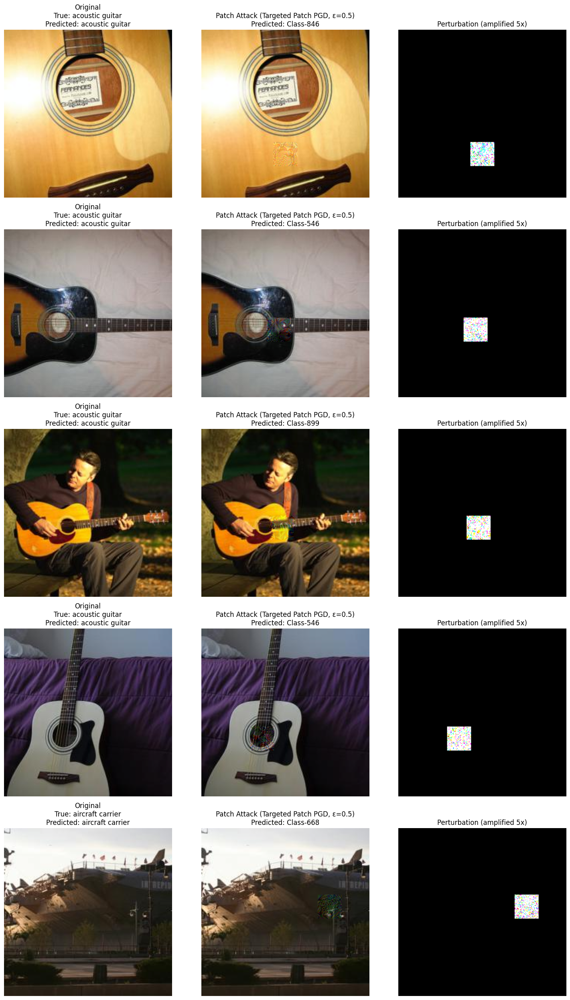


Final Results:
Original Images - Top-1 Accuracy: 76.00%, Top-5 Accuracy: 94.20%
Adversarial Images - Top-1 Accuracy: 18.00%, Top-5 Accuracy: 36.40%
Accuracy Drop - Top-1: 58.00%, Top-5: 57.80%


In [ ]:
import cv2

def compute_gradcam(model, image, true_label, device='cuda'):
    """
    Computes Grad-CAM for an image to identify salient regions.

    Args:
        model: The neural network model
        image: Input image tensor (1, C, H, W)
        true_label: True label for the image
        device: Device to run the computation on

    Returns:
        Grad-CAM heatmap normalized to [0, 1]
    """
    # Set model to evaluation mode
    model.eval()

    # For ResNet, we need to get the final convolutional layer
    # First, identify the last convolutional layer
    last_conv_layer = None
    for name, module in model.named_modules():
        if isinstance(module, torch.nn.Conv2d):
            last_conv_layer = (name, module)

    if last_conv_layer is None:
        print("Could not find convolutional layer in model")
        return np.ones((image.shape[2], image.shape[3]))

    layer_name, target_layer = last_conv_layer

    # Storage for activations and gradients
    activations = {}
    gradients = {}

    # Forward hook to get activations
    def forward_hook(module, input, output):
        activations['value'] = output.detach()

    # Backward hook to get gradients
    def backward_hook(module, grad_input, grad_output):
        gradients['value'] = grad_output[0].detach()

    # Register the hooks
    forward_handle = target_layer.register_forward_hook(forward_hook)
    backward_handle = target_layer.register_full_backward_hook(backward_hook)

    # Forward pass
    model.zero_grad()
    output = model(image)

    # We only want the gradient with respect to the true class
    one_hot = torch.zeros_like(output)
    one_hot[0, true_label] = 1

    # Backward pass
    output.backward(gradient=one_hot, retain_graph=True)

    # Get activations and gradients
    activations = activations['value']
    gradients = gradients['value']

    # Remove the hooks
    forward_handle.remove()
    backward_handle.remove()

    # Calculate importance weights
    weights = torch.mean(gradients, dim=(2, 3), keepdim=True)

    # Generate weighted activations
    cam = torch.sum(weights * activations, dim=1, keepdim=True)

    # Apply ReLU
    cam = torch.relu(cam)

    # Normalize
    if torch.max(cam) > 0:
        cam = cam / torch.max(cam)

    # Resize to input resolution
    cam = cam.squeeze().cpu().detach().numpy()

    # Resize to input image dimensions using OpenCV
    height, width = image.shape[2], image.shape[3]
    cam = cv2.resize(cam, (width, height))

    return cam

def find_salient_patch_position(model, image, true_label, patch_size=32, device='cuda'):
    """
    Finds the most salient region in the image for placing the patch.

    Args:
        model: The neural network model
        image: Input image tensor
        true_label: True label for the image
        patch_size: Size of the patch to be placed
        device: Device to run the computation on

    Returns:
        (top, left) coordinates for the patch
    """
    try:
        # Get Grad-CAM heatmap
        heatmap = compute_gradcam(model, image.unsqueeze(0), true_label, device)

        # Find the optimal patch position using sliding window
        height, width = heatmap.shape
        max_sum = -float('inf')
        optimal_position = (0, 0)

        # Ensure patch fits within image
        if height <= patch_size or width <= patch_size:
            return 0, 0

        # Slide the patch window over the heatmap to find the position with highest saliency sum
        for i in range(height - patch_size + 1):
            for j in range(width - patch_size + 1):
                window_sum = np.sum(heatmap[i:i+patch_size, j:j+patch_size])
                if window_sum > max_sum:
                    max_sum = window_sum
                    optimal_position = (i, j)

        return optimal_position

    except Exception as e:
        print(f"Error in salient region detection: {e}")
        # Fallback to random position
        if image.shape[1] <= patch_size or image.shape[2] <= patch_size:
            return 0, 0
        else:
            top = torch.randint(0, image.shape[1] - patch_size, (1,)).item()
            left = torch.randint(0, image.shape[2] - patch_size, (1,)).item()
            return top, left

def patch_pgd_attack(model, images, labels, patch_size=32, epsilon=0.5, alpha=0.1,
                    num_iter=40, random_start=True, target=None, device='cuda',
                    use_adaptive_step=True, ensemble_size=3, use_salient=True):
    """
    Performs a patch-based PGD attack, modifying only a 32x32 patch of the image.

    Args:
        model: The neural network model
        images: Input images
        labels: True labels for the images
        patch_size: Size of the square patch to perturb (default: 32)
        epsilon: Attack budget (L∞ constraint within the patch)
        alpha: Initial step size for each iteration
        num_iter: Number of iterations
        random_start: Whether to start with a random perturbation
        target: Target labels for targeted attack (None for untargeted)
        device: Device to run the attack on
        use_adaptive_step: Whether to adaptively reduce step size
        ensemble_size: Number of targets to try (for ensemble approach)

    Returns:
        Perturbed images
    """
    # Make sure the model is in evaluation mode
    model.eval()

    # Clone the images
    perturbed_images = images.clone().detach()

    # Generate a mask for the patch
    batch_size, channels, height, width = images.shape

    # Tracking for best results in ensemble approach
    if target is not None and ensemble_size > 1:
        # Get initial predictions on clean images
        with torch.no_grad():
            initial_outputs = model(images)
            _, initial_top5 = torch.topk(initial_outputs, 5, dim=1)

        # Track best adversarial examples
        best_adv_images = None
        best_confidences = torch.ones(images.size(0)).to(device) * float('inf')

        # Try different targets and patch positions for each image
        for e in range(ensemble_size):
            # Generate patch positions for each image in the batch
            patch_masks = []
            for i in range(batch_size):
                try:
                    if use_salient:
                        # Find salient region for patch placement
                        top, left = find_salient_patch_position(model, images[i], labels[i], patch_size, device)
                    else:
                        # Random patch position (original approach)
                        if height <= patch_size or width <= patch_size:
                            top = 0
                            left = 0
                        else:
                            top = torch.randint(0, height - patch_size, (1,)).item()
                            left = torch.randint(0, width - patch_size, (1,)).item()
                except Exception as e:
                    print(f"Error in patch position selection: {e}")
                    # Fallback to random position
                    if height <= patch_size or width <= patch_size:
                        top = 0
                        left = 0
                    else:
                        top = torch.randint(0, height - patch_size, (1,)).item()
                        left = torch.randint(0, width - patch_size, (1,)).item()

                # Create mask (1 for patch area, 0 elsewhere)
                mask = torch.zeros((channels, height, width), device=device)
                mask[:, top:top+patch_size, left:left+patch_size] = 1.0
                patch_masks.append(mask)

            # Stack masks for batch processing
            patch_masks = torch.stack(patch_masks)

            # Generate new random targets for this ensemble run
            if e == 0:
                # First run - use provided targets
                current_targets = target
            else:
                # Subsequent runs - generate new random targets (least likely classes)
                with torch.no_grad():
                    # Get least likely classes for each image
                    current_targets = torch.zeros_like(labels)
                    for i in range(images.size(0)):
                        # Get probabilities
                        probs = torch.nn.functional.softmax(initial_outputs[i], dim=0)
                        # Set the true class and top-5 to have high probability, so they're not chosen
                        for k in range(5):
                            if initial_top5[i, k] == labels[i]:
                                continue
                            else:
                                probs[initial_top5[i, k]] = 1.0

                        # Choose a target different from the true label
                        _, indices = torch.sort(probs)
                        for idx in indices:
                            if idx.item() != labels[i].item():
                                current_targets[i] = idx
                                break

            # Run patch PGD with current targets and patch positions
            current_adv_images = _patch_pgd_single_run(model, images, labels, patch_masks, epsilon,
                                                      alpha, num_iter, random_start, current_targets,
                                                      device, use_adaptive_step)

            # Evaluate effectiveness
            with torch.no_grad():
                current_outputs = model(current_adv_images)
                current_confidences = torch.nn.functional.softmax(current_outputs, dim=1)

                # Get confidence in true class
                true_class_confidences = torch.zeros(images.size(0))
                for i in range(images.size(0)):
                    true_class_confidences[i] = current_confidences[i, labels[i]].item()

                # Update best adversarial examples where this run is better
                for i in range(images.size(0)):
                    if true_class_confidences[i] < best_confidences[i]:
                        if best_adv_images is None:
                            best_adv_images = current_adv_images.clone()
                        else:
                            best_adv_images[i] = current_adv_images[i].clone()
                        best_confidences[i] = true_class_confidences[i]

        # Return the best adversarial examples across all ensemble runs
        return best_adv_images if best_adv_images is not None else current_adv_images
    else:
        # If not using ensemble, create a random patch mask for each image
        patch_masks = []
        for i in range(batch_size):
            # Random patch position
            if height <= patch_size or width <= patch_size:
                top = 0
                left = 0
            else:
                top = torch.randint(0, height - patch_size, (1,)).item()
                left = torch.randint(0, width - patch_size, (1,)).item()

            # Create mask (1 for patch area, 0 elsewhere)
            mask = torch.zeros((channels, height, width), device=device)
            mask[:, top:top+patch_size, left:left+patch_size] = 1.0
            patch_masks.append(mask)

        # Stack masks for batch processing
        patch_masks = torch.stack(patch_masks)

        # Run PGD once
        return _patch_pgd_single_run(model, images, labels, patch_masks, epsilon, alpha,
                                    num_iter, random_start, target, device, use_adaptive_step)

def _patch_pgd_single_run(model, images, labels, patch_masks, epsilon, alpha, num_iter,
                         random_start, target, device, use_adaptive_step):
    """Helper function to run a single PGD attack with patch constraints"""
    # Clone the images
    perturbed_images = images.clone().detach()

    # Start with random perturbation if specified (only in the patch area)
    if random_start:
        # Random perturbation within epsilon (only applied to patch area)
        random_noise = torch.FloatTensor(images.shape).uniform_(-epsilon, epsilon).to(device)
        random_noise = random_noise * patch_masks  # Only apply to patch area
        perturbed_images = perturbed_images + random_noise

        # Project back to valid image range
        for c in range(3):  # For each channel
            channel_min = (0 - mean_norms[c]) / std_norms[c]
            channel_max = (1 - mean_norms[c]) / std_norms[c]
            perturbed_images[:, c] = torch.clamp(perturbed_images[:, c], min=channel_min, max=channel_max)

    # Iterate for num_iter iterations
    for i in range(num_iter):
        # Adaptive step size calculation
        if use_adaptive_step:
            # Gradually reduce step size for better convergence
            current_alpha = alpha * (1 - 0.75 * i / num_iter)
        else:
            current_alpha = alpha

        # Set requires_grad for perturbed images
        perturbed_images.requires_grad = True

        # Forward pass
        outputs = model(perturbed_images)

        # Calculate loss
        if target is not None:
            # For targeted attacks, use margin loss
            loss = margin_loss(outputs, labels, target)
            # Add entropy component
            entropy = entropy_loss(outputs, labels, target)
            loss = loss + 0.5 * entropy
        else:
            # For untargeted attacks, use multi-target approach
            loss = multi_target_loss(outputs, labels, num_targets=3)
            # Add confidence weighting
            conf_loss = confidence_weighted_loss(outputs, labels)
            loss = loss + 0.7 * conf_loss

        # Backward pass
        model.zero_grad()
        loss.backward()

        # Get the gradient sign
        with torch.no_grad():
            signed_grad = torch.sign(perturbed_images.grad.data)

            # Only update the pixels in the patch (apply mask to gradients)
            masked_grad = signed_grad * patch_masks

            # Update perturbed images with the step size
            if target is not None:
                # For targeted attack, move in negative gradient direction
                perturbed_images = perturbed_images - current_alpha * masked_grad
            else:
                # For untargeted attack, move in positive gradient direction
                perturbed_images = perturbed_images + current_alpha * masked_grad

            # Project back to epsilon ball around original images (only for patch area)
            delta = perturbed_images - images
            # Apply mask to delta to only constrain the patch area
            clamped_delta = torch.clamp(delta * patch_masks, min=-epsilon, max=epsilon)
            # For non-patch areas, delta should be zero
            delta = clamped_delta * patch_masks
            perturbed_images = images + delta

            # Project back to valid image range
            for c in range(3):  # For each channel
                channel_min = (0 - mean_norms[c]) / std_norms[c]
                channel_max = (1 - mean_norms[c]) / std_norms[c]
                perturbed_images[:, c] = torch.clamp(perturbed_images[:, c], min=channel_min, max=channel_max)

    return perturbed_images

# Loss functions from Task 3
def margin_loss(outputs, true_labels, target_labels=None):
    # Get the logits for the true class
    batch_size = outputs.size(0)
    true_class_logits = outputs[torch.arange(batch_size), true_labels]

    if target_labels is not None:
        # Targeted attack: maximize margin between target and true class
        target_class_logits = outputs[torch.arange(batch_size), target_labels]
        # We want: target_logits > true_logits by as much as possible
        return torch.mean(true_class_logits - target_class_logits)
    else:
        # Untargeted attack: minimize true class logit vs all others
        other_logits = outputs.clone()
        # Set true class logits to a very low value so they're ignored in the max operation
        other_logits[torch.arange(batch_size), true_labels] = -float('inf')
        # Get the highest non-true class logit
        best_other_logits = torch.max(other_logits, dim=1)[0]
        # We want: other_logits > true_logits by as much as possible
        return torch.mean(true_class_logits - best_other_logits)

def confidence_weighted_loss(outputs, true_labels, target_labels=None, kappa=20.0):
    # Get probabilities
    probs = torch.nn.functional.softmax(outputs, dim=1)
    batch_size = outputs.size(0)

    # Get confidence in true class
    true_class_confidence = probs[torch.arange(batch_size), true_labels]

    if target_labels is not None:
        # Targeted: maximize target confidence, minimize true confidence
        target_class_confidence = probs[torch.arange(batch_size), target_labels]
        # Weight by how confident the model is in the true class
        # The more confident it is, the harder we should attack
        confidence_weights = torch.pow(true_class_confidence, 2)
        return torch.mean((true_class_confidence - target_class_confidence) * confidence_weights * kappa)
    else:
        # Untargeted: minimize true confidence
        # Weight loss more for confident predictions
        confidence_weights = torch.pow(true_class_confidence, 2)
        return torch.mean(true_class_confidence * confidence_weights * kappa)

def entropy_loss(outputs, true_labels, target_labels=None, lambda_entropy=0.5):
    # Standard classification loss
    standard_loss = torch.nn.functional.cross_entropy(outputs, true_labels)

    # Calculate entropy of the softmax distribution
    probs = torch.nn.functional.softmax(outputs, dim=1)
    log_probs = torch.nn.functional.log_softmax(outputs, dim=1)
    entropy = -torch.sum(probs * log_probs, dim=1).mean()

    if target_labels is not None:
        # For targeted attacks, we want to minimize entropy for target class
        target_loss = -torch.nn.functional.cross_entropy(outputs, target_labels)
        # Balance between increasing entropy overall and targeting specific class
        return target_loss - lambda_entropy * entropy
    else:
        # For untargeted attacks, maximize entropy (uncertainty)
        return standard_loss - lambda_entropy * entropy

def multi_target_loss(outputs, true_labels, num_targets=3):
    batch_size = outputs.size(0)
    num_classes = outputs.size(1)

    # Get the logits for the true class
    true_class_logits = outputs[torch.arange(batch_size), true_labels]

    # Create a mask to exclude the true class when finding top targets
    mask = torch.ones((batch_size, num_classes), device=outputs.device)
    mask[torch.arange(batch_size), true_labels] = 0

    # Find the top-k most likely incorrect classes
    masked_outputs = outputs * mask - (1 - mask) * 10000.0  # Large negative for true class
    _, target_indices = torch.topk(masked_outputs, num_targets, dim=1)

    # Calculate the margin loss for each target class
    total_loss = 0
    for i in range(num_targets):
        target_logits = outputs[torch.arange(batch_size), target_indices[:, i]]
        total_loss += torch.mean(true_class_logits - target_logits)

    return total_loss / num_targets

def create_and_evaluate_patch_adversarial_dataset(model, data_loader, patch_size=32, epsilon=0.5,
                                                alpha=0.1, num_iter=40, random_start=True,
                                                targeted=True, device='cuda',
                                                save_dir='./AdversarialTestSet3', num_vis_examples=5,
                                                use_adaptive_step=True, ensemble_size=3,
                                                use_salient=True):
    """
    Creates an adversarial dataset using patch-based PGD and evaluates model performance.
    """
    model.eval()

    # Create required directories
    os.makedirs(save_dir, exist_ok=True)

    # Parse label mapping
    # Assuming labels_list is a list of strings in the format "401: accordion"
    # Create a mapping from ImageNet index to label name
    global label_map  # Make it accessible to other functions
    label_map = {}
    folder_to_imagenet = {}

    # Parse label mapping from json file content
    with open("/content/drive/MyDrive/ECE7123DL/TestDataSet/labels_list.json", 'r') as f:
        labels_list = json.load(f)

    for label_entry in labels_list:
        parts = label_entry.split(': ')
        imagenet_idx = int(parts[0])
        label_name = parts[1]
        label_map[imagenet_idx] = label_name

        # Assuming folder indices are 0-indexed and correspond to ImageNet indices 401, 402, ...
        folder_idx = imagenet_idx - 401
        folder_to_imagenet[folder_idx] = imagenet_idx

    # Storage for evaluation
    all_original_images = []
    all_perturbed_images = []
    all_labels = []

    # For visualization
    vis_examples = []

    # Counter for successful attacks
    total_images = 0
    successful_attacks = 0

    print(f"Processing {len(data_loader)} batches with Patch PGD attack "
          f"(patch_size={patch_size}, epsilon={epsilon}, alpha={alpha}, iterations={num_iter})...")

    # Process each batch
    for batch_idx, (images, labels) in enumerate(tqdm(data_loader)):
        images, labels = images.to(device), labels.to(device)

        # Map folder indices to ImageNet indices
        imagenet_labels = torch.tensor([folder_to_imagenet.get(label.item(), -1) for label in labels]).to(device)

        # Forward pass to get original predictions
        with torch.no_grad():
            outputs = model(images)
            _, original_preds = torch.max(outputs, 1)
            _, original_top5 = torch.topk(outputs, 5, dim=1)

        # Create target labels for targeted attack if needed
        target_labels = None
        if targeted:
            with torch.no_grad():
                # Get the probability distribution
                softmax_probs = torch.nn.functional.softmax(outputs, dim=1)

                # Strategy: target classes that are semantically confusable
                # For each image, find classes with mid-range probabilities (not highest, not lowest)
                # These are classes the model slightly confuses with the true class
                _, sorted_indices = torch.sort(softmax_probs, dim=1, descending=True)

                # Choose targets from positions 5-15 in the sorted probabilities
                confusable_position = 10  # Can be tuned between 5-15
                target_indices = []

                for i, true_label in enumerate(imagenet_labels):
                    # Ensure the target is different from the true label
                    candidate_position = confusable_position
                    while candidate_position < softmax_probs.size(1):
                        candidate = sorted_indices[i, candidate_position].item()
                        if candidate != true_label.item():
                            target_indices.append(candidate)
                            break
                        candidate_position += 1

                    # Fallback if no suitable target found
                    if candidate_position >= softmax_probs.size(1):
                        # Choose second most likely prediction if different from true label
                        if sorted_indices[i, 1].item() != true_label.item():
                            target_indices.append(sorted_indices[i, 1].item())
                        else:
                            target_indices.append(sorted_indices[i, 2].item())

                target_labels = torch.tensor(target_indices).to(device)

        # Create adversarial examples with patch attack
        perturbed_images = patch_pgd_attack(model, images, imagenet_labels, patch_size, epsilon,
                                          alpha, num_iter, random_start, target_labels, device,
                                          use_adaptive_step, ensemble_size, use_salient)

        # Get predictions for perturbed images
        with torch.no_grad():
            perturbed_outputs = model(perturbed_images)
            _, perturbed_preds = torch.max(perturbed_outputs, 1)
            _, perturbed_top5 = torch.topk(perturbed_outputs, 5, dim=1)

        # Save images and update counters
        for i in range(images.size(0)):
            # Skip if label mapping failed
            if imagenet_labels[i].item() == -1:
                continue

            # Store for evaluation
            all_original_images.append(images[i].cpu())
            all_perturbed_images.append(perturbed_images[i].cpu())
            all_labels.append(imagenet_labels[i].item())

            # Check if attack was successful (original correct, perturbed wrong)
            original_correct = (original_preds[i].item() == imagenet_labels[i].item())
            perturbed_correct = (perturbed_preds[i].item() == imagenet_labels[i].item())

            # Count successful attacks
            total_images += 1
            if original_correct and not perturbed_correct:
                successful_attacks += 1

                # Store for visualization if we need more examples
                if len(vis_examples) < num_vis_examples:
                    vis_examples.append({
                        'original': images[i].cpu(),
                        'perturbed': perturbed_images[i].cpu(),
                        'perturbation': perturbed_images[i].cpu() - images[i].cpu(),
                        'original_pred': original_preds[i].item(),
                        'perturbed_pred': perturbed_preds[i].item(),
                        'true_label': imagenet_labels[i].item(),
                        'label_name': label_map.get(imagenet_labels[i].item(), 'Unknown')
                    })

            # Save each perturbed image in the dataset structure
            img_class = data_loader.dataset.classes[labels[i].item()]
            os.makedirs(os.path.join(save_dir, img_class), exist_ok=True)

            # Get original filename from the dataset
            img_idx = batch_idx * data_loader.batch_size + i
            if img_idx < len(data_loader.dataset.imgs):  # Make sure index is in range
                img_path = data_loader.dataset.imgs[img_idx][0]
                img_name = os.path.basename(img_path)

                # Convert tensor to PIL image for saving
                perturbed_img = perturbed_images[i].cpu().clone()
                perturbed_img = perturbed_img * torch.tensor(std_norms).view(3, 1, 1) + torch.tensor(mean_norms).view(3, 1, 1)
                perturbed_img = torch.clamp(perturbed_img, 0, 1)
                perturbed_img = transforms.ToPILImage()(perturbed_img)

                # Save the perturbed image
                save_path = os.path.join(save_dir, img_class, img_name)
                perturbed_img.save(save_path)
            else:
                print(f"Warning: Image index {img_idx} out of range.")

    # Print attack success rate
    attack_success_rate = (successful_attacks / total_images) * 100 if total_images > 0 else 0
    print(f"\nAttack success rate: {attack_success_rate:.2f}% ({successful_attacks}/{total_images})")

    # Evaluate original and adversarial accuracies
    original_acc = evaluate_model_on_images(model, all_original_images, all_labels, device)
    adversarial_acc = evaluate_model_on_images(model, all_perturbed_images, all_labels, device)

    return vis_examples, original_acc, adversarial_acc

def evaluate_model_on_images(model, images, labels, device='cuda'):
    """
    Evaluates model performance (top-1 and top-5 accuracy) on a list of images.

    Returns:
        (top1_accuracy, top5_accuracy)
    """
    model.eval()
    correct_top1 = 0
    correct_top5 = 0
    total = 0

    # Batch size for evaluation
    batch_size = 32
    num_batches = (len(images) + batch_size - 1) // batch_size

    with torch.no_grad():
        for i in range(num_batches):
            # Get batch indices
            start_idx = i * batch_size
            end_idx = min((i + 1) * batch_size, len(images))

            # Create batch tensors
            batch_images = torch.stack([images[j] for j in range(start_idx, end_idx)]).to(device)
            batch_labels = [labels[j] for j in range(start_idx, end_idx)]

            # Forward pass
            outputs = model(batch_images)

            # Get top predictions
            _, predicted_top1 = torch.max(outputs.data, 1)
            _, predicted_top5 = torch.topk(outputs.data, 5, dim=1)

            # Compare predictions to true labels
            for j in range(len(batch_labels)):
                true_label = batch_labels[j]

                # Check top-1 accuracy
                if predicted_top1[j].item() == true_label:
                    correct_top1 += 1

                # Check top-5 accuracy
                if true_label in predicted_top5[j].cpu().numpy():
                    correct_top5 += 1

            total += len(batch_labels)

    accuracy_top1 = 100 * correct_top1 / total
    accuracy_top5 = 100 * correct_top5 / total

    return accuracy_top1, accuracy_top5

def get_imagenet_class_names():
    """
    Get class names for all 1000 ImageNet classes.
    Returns a dictionary mapping class indices to class names.
    """
    # For the 100 classes in our test set, we already have names in label_map
    full_label_map = {}

    # Copy our known labels (from the test set)
    for idx, name in label_map.items():
        full_label_map[idx] = name

    # For classes outside our test set, we'll use a simplified name
    for i in range(1, 1001):
        if i not in full_label_map:
            full_label_map[i] = f"Class-{i}"

    return full_label_map

def visualize_patch_adversarial_examples(examples, patch_size=32, epsilon=0.5, attack_name="Patch PGD"):
    """
    Creates a visualization of patch adversarial examples.
    Shows original image, perturbed image, and difference (amplified for visibility).
    """
    num_examples = len(examples)
    fig, axes = plt.subplots(num_examples, 3, figsize=(15, 5 * num_examples))

    if num_examples == 1:
        axes = axes.reshape(1, -1)

    # Get full ImageNet class names
    full_label_map = get_imagenet_class_names()

    for i, example in enumerate(examples):
        # Get images
        orig_img = example['original']
        pert_img = example['perturbed']

        # Denormalize for visualization
        orig_img = orig_img * torch.tensor(std_norms).view(3, 1, 1) + torch.tensor(mean_norms).view(3, 1, 1)
        orig_img = torch.clamp(orig_img, 0, 1)

        pert_img = pert_img * torch.tensor(std_norms).view(3, 1, 1) + torch.tensor(mean_norms).view(3, 1, 1)
        pert_img = torch.clamp(pert_img, 0, 1)

        # Convert to numpy arrays for visualization
        orig_img_np = orig_img.permute(1, 2, 0).numpy()
        pert_img_np = pert_img.permute(1, 2, 0).numpy()

        # Calculate the difference and amplify it for visibility
        diff_img = np.abs(pert_img_np - orig_img_np)
        # Enhance visibility of the difference
        diff_img = diff_img / (diff_img.max() + 1e-8) * 5  # Amplify for visibility
        diff_img = np.clip(diff_img, 0, 1)  # Clip to valid range

        # Get class names and predictions
        true_label = example['label_name']
        orig_pred = full_label_map.get(example['original_pred'], f"Class-{example['original_pred']}")
        pert_pred = full_label_map.get(example['perturbed_pred'], f"Class-{example['perturbed_pred']}")

        # Plot original image
        axes[i, 0].imshow(orig_img_np)
        axes[i, 0].set_title(f"Original\nTrue: {true_label}\nPredicted: {orig_pred}")
        axes[i, 0].axis('off')

        # Plot perturbed image
        axes[i, 1].imshow(pert_img_np)
        axes[i, 1].set_title(f"Patch Attack ({attack_name}, ε={epsilon})\nPredicted: {pert_pred}")
        axes[i, 1].axis('off')

        # Plot difference
        axes[i, 2].imshow(diff_img)
        axes[i, 2].set_title(f"Perturbation (amplified 5x)")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.savefig(f'patch_adversarial_examples_{patch_size}x{patch_size}.png', dpi=300)
    plt.show()

def execute_task4(model, data_loader, patch_size=32, epsilon=0.5, alpha=0.1, num_iter=40,
                 random_start=True, targeted=True, device='cuda',
                 save_dir='./AdversarialTestSet3', use_adaptive_step=True, ensemble_size=3,
                 use_salient=True):
    """
    Execute Task 4: Create adversarial examples using patch-based PGD and evaluate.
    """
    attack_type = "Targeted Patch PGD" if targeted else "Patch PGD"
    print(f"Task 4: Patch Attacks using {attack_type} with patch size = {patch_size}x{patch_size}, "
          f"epsilon = {epsilon}, alpha = {alpha}, iterations = {num_iter}")
    print("Creating adversarial images with patch perturbations...")

    # Create and evaluate patch-based adversarial dataset
    vis_examples, original_acc, adversarial_acc = create_and_evaluate_patch_adversarial_dataset(
        model, data_loader, patch_size, epsilon, alpha, num_iter, random_start, targeted, device, save_dir,
        use_adaptive_step=use_adaptive_step, ensemble_size=ensemble_size, use_salient=use_salient
    )

    # Visualize examples
    if vis_examples:
        print("Visualizing successful patch adversarial examples...")
        visualize_patch_adversarial_examples(vis_examples, patch_size, epsilon, attack_type)
    else:
        print("No successful patch adversarial examples found for visualization.")

    # Print final results
    print("\nFinal Results:")
    print(f"Original Images - Top-1 Accuracy: {original_acc[0]:.2f}%, Top-5 Accuracy: {original_acc[1]:.2f}%")
    print(f"Adversarial Images - Top-1 Accuracy: {adversarial_acc[0]:.2f}%, Top-5 Accuracy: {adversarial_acc[1]:.2f}%")
    print(f"Accuracy Drop - Top-1: {original_acc[0] - adversarial_acc[0]:.2f}%, Top-5: {original_acc[1] - adversarial_acc[1]:.2f}%")
    # print(f"Relative Accuracy Drop - Top-1: {((original_acc[0] - adversarial_acc[0]) / original_acc[0]) * 100:.2f}%, "
    #       f"Top-5: {((original_acc[1] - adversarial_acc[1]) / original_acc[1]) * 100:.2f}%")

    return original_acc, adversarial_acc, vis_examples



# Hyperparameters for patch attack
patch_size = 32             # Size of the patch (32x32)
epsilon = 0.5               # Higher epsilon for patch attack (as specified in the task)
alpha = 0.1                 # Higher step size for more aggressive updates
num_iter = 40               # More iterations to ensure convergence
random_start = True         # Start with random perturbation
targeted = True             # Use targeted attack for better effectiveness
use_adaptive_step = True    # Use adaptive step size
ensemble_size = 3           # Try multiple targets and patch positions
use_salient = True          # Use salient pixels for patch attack
save_dir = "./AdversarialTestSet3"

# Execute Task 4
original_acc, adversarial_acc, vis_examples = execute_task4(
    pretrained_model, data_loader, patch_size, epsilon, alpha, num_iter,
    random_start, targeted, device, save_dir, use_adaptive_step, ensemble_size,
    use_salient
)

# Task 5 Transferring attacks

Using device: cuda:0
Loaded 100 labels.

Loading ResNet-34 model (original target)...
Loading DenseNet-121 model for transferability testing...


Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 156MB/s]
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


Loading EfficientNet-B0 as a second transferability model...


100%|██████████| 20.5M/20.5M [00:00<00:00, 133MB/s] 



Evaluating dataset: Original
Loaded dataset from /content/drive/MyDrive/ECE7123DL/TestDataSet with 500 images

Testing ResNet-34 on Original dataset...
Evaluating ResNet-34 on dataset...


100%|██████████| 16/16 [00:01<00:00,  9.93it/s]


ResNet-34 - Top-1 Accuracy: 76.00%, Top-5 Accuracy: 94.20%

Testing DenseNet-121 on Original dataset...
Evaluating DenseNet-121 on dataset...


100%|██████████| 16/16 [00:02<00:00,  7.72it/s]


DenseNet-121 - Top-1 Accuracy: 74.60%, Top-5 Accuracy: 93.60%

Testing EfficientNet-B0 on Original dataset...
Evaluating EfficientNet-B0 on dataset...


100%|██████████| 16/16 [00:01<00:00,  8.87it/s]


EfficientNet-B0 - Top-1 Accuracy: 83.00%, Top-5 Accuracy: 96.80%

Evaluating dataset: FGSM (Adv1)
Loaded dataset from ./AdversarialTestSet1 with 500 images

Testing ResNet-34 on FGSM (Adv1) dataset...
Evaluating ResNet-34 on dataset...


100%|██████████| 16/16 [00:00<00:00, 20.70it/s]


ResNet-34 - Top-1 Accuracy: 44.60%, Top-5 Accuracy: 79.40%

Testing DenseNet-121 on FGSM (Adv1) dataset...
Evaluating DenseNet-121 on dataset...


100%|██████████| 16/16 [00:00<00:00, 16.32it/s]


DenseNet-121 - Top-1 Accuracy: 71.00%, Top-5 Accuracy: 92.40%

Testing EfficientNet-B0 on FGSM (Adv1) dataset...
Evaluating EfficientNet-B0 on dataset...


100%|██████████| 16/16 [00:00<00:00, 19.45it/s]


EfficientNet-B0 - Top-1 Accuracy: 79.60%, Top-5 Accuracy: 96.40%

Evaluating dataset: Improved (Adv2)
Loaded dataset from ./AdversarialTestSet2 with 500 images

Testing ResNet-34 on Improved (Adv2) dataset...
Evaluating ResNet-34 on dataset...


100%|██████████| 16/16 [00:00<00:00, 20.80it/s]


ResNet-34 - Top-1 Accuracy: 65.40%, Top-5 Accuracy: 87.60%

Testing DenseNet-121 on Improved (Adv2) dataset...
Evaluating DenseNet-121 on dataset...


100%|██████████| 16/16 [00:00<00:00, 16.15it/s]


DenseNet-121 - Top-1 Accuracy: 73.40%, Top-5 Accuracy: 92.20%

Testing EfficientNet-B0 on Improved (Adv2) dataset...
Evaluating EfficientNet-B0 on dataset...


100%|██████████| 16/16 [00:00<00:00, 18.47it/s]


EfficientNet-B0 - Top-1 Accuracy: 81.40%, Top-5 Accuracy: 96.60%

Evaluating dataset: Patch (Adv3)
Loaded dataset from ./AdversarialTestSet3 with 500 images

Testing ResNet-34 on Patch (Adv3) dataset...
Evaluating ResNet-34 on dataset...


100%|██████████| 16/16 [00:00<00:00, 20.04it/s]


ResNet-34 - Top-1 Accuracy: 43.40%, Top-5 Accuracy: 70.20%

Testing DenseNet-121 on Patch (Adv3) dataset...
Evaluating DenseNet-121 on dataset...


100%|██████████| 16/16 [00:01<00:00, 15.98it/s]


DenseNet-121 - Top-1 Accuracy: 69.40%, Top-5 Accuracy: 90.80%

Testing EfficientNet-B0 on Patch (Adv3) dataset...
Evaluating EfficientNet-B0 on dataset...


100%|██████████| 16/16 [00:00<00:00, 19.15it/s]


EfficientNet-B0 - Top-1 Accuracy: 78.60%, Top-5 Accuracy: 95.80%


Complete Results Table:
        Dataset           Model  Top-1 Accuracy  Top-5 Accuracy
       Original       ResNet-34            76.0            94.2
       Original    DenseNet-121            74.6            93.6
       Original EfficientNet-B0            83.0            96.8
    FGSM (Adv1)       ResNet-34            44.6            79.4
    FGSM (Adv1)    DenseNet-121            71.0            92.4
    FGSM (Adv1) EfficientNet-B0            79.6            96.4
Improved (Adv2)       ResNet-34            65.4            87.6
Improved (Adv2)    DenseNet-121            73.4            92.2
Improved (Adv2) EfficientNet-B0            81.4            96.6
   Patch (Adv3)       ResNet-34            43.4            70.2
   Patch (Adv3)    DenseNet-121            69.4            90.8
   Patch (Adv3) EfficientNet-B0            78.6            95.8


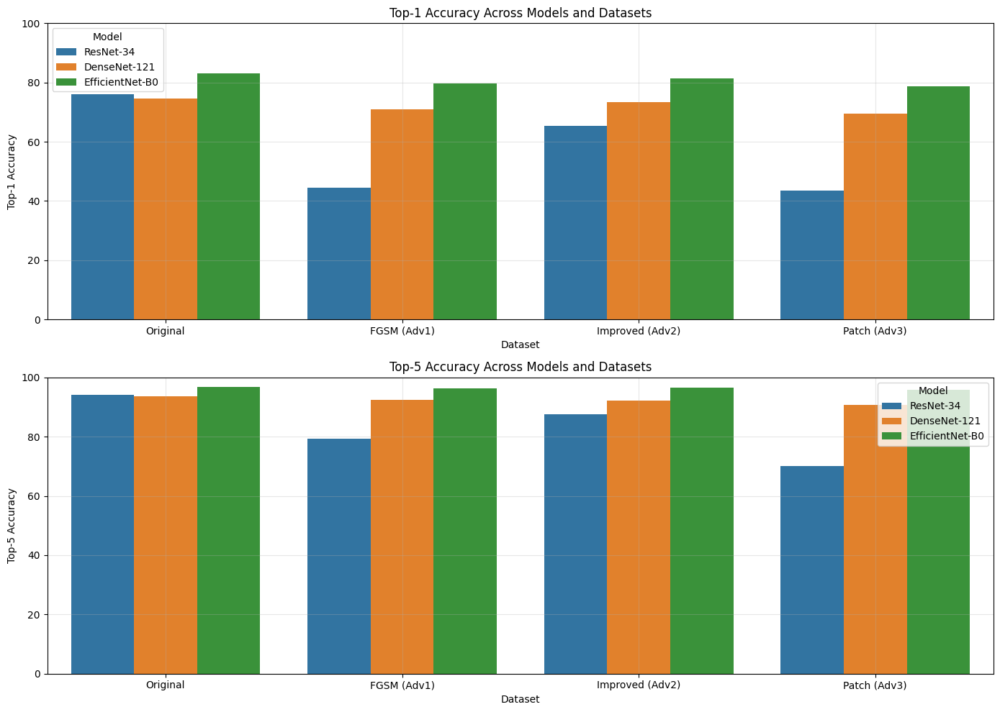


Transferability Analysis:

ResNet-34 Accuracy Drop Analysis:
FGSM (Adv1) Attack:
  Top-1 Accuracy Drop: 31.40% (Relative: 41.32%)
  Top-5 Accuracy Drop: 14.80% (Relative: 15.71%)
Improved (Adv2) Attack:
  Top-1 Accuracy Drop: 10.60% (Relative: 13.95%)
  Top-5 Accuracy Drop: 6.60% (Relative: 7.01%)
Patch (Adv3) Attack:
  Top-1 Accuracy Drop: 32.60% (Relative: 42.89%)
  Top-5 Accuracy Drop: 24.00% (Relative: 25.48%)

DenseNet-121 Accuracy Drop Analysis:
FGSM (Adv1) Attack:
  Top-1 Accuracy Drop: 3.60% (Relative: 4.83%)
  Top-5 Accuracy Drop: 1.20% (Relative: 1.28%)
Improved (Adv2) Attack:
  Top-1 Accuracy Drop: 1.20% (Relative: 1.61%)
  Top-5 Accuracy Drop: 1.40% (Relative: 1.50%)
Patch (Adv3) Attack:
  Top-1 Accuracy Drop: 5.20% (Relative: 6.97%)
  Top-5 Accuracy Drop: 2.80% (Relative: 2.99%)

EfficientNet-B0 Accuracy Drop Analysis:
FGSM (Adv1) Attack:
  Top-1 Accuracy Drop: 3.40% (Relative: 4.10%)
  Top-5 Accuracy Drop: 0.40% (Relative: 0.41%)
Improved (Adv2) Attack:
  Top-1 Accuracy 

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import json
import os
from PIL import Image
from tqdm import tqdm
import pandas as pd
import seaborn as sns

# Define constants
mean_norms = np.array([0.485, 0.456, 0.406])
std_norms = np.array([0.229, 0.224, 0.225])
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Define the preprocessing transformations
plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])

# Load the labels list from the JSON file
json_path = "/content/drive/MyDrive/ECE7123DL/TestDataSet/labels_list.json"
with open(json_path, 'r') as f:
    labels_list = json.load(f)

# Create a mapping from label index to label name
label_map = {}
for label_entry in labels_list:
    parts = label_entry.split(': ')
    index = int(parts[0])
    label_name = parts[1]
    label_map[index] = label_name

print(f"Loaded {len(label_map)} labels.")

# Create a mapping from folder index to ImageNet index
folder_to_imagenet = {}
for label_entry in labels_list:
    parts = label_entry.split(': ')
    imagenet_idx = int(parts[0])  # This is like 401, 402, etc.
    folder_idx = imagenet_idx - 401  # Assuming they're in order
    folder_to_imagenet[folder_idx] = imagenet_idx

def load_dataset(dataset_path):
    """Load a dataset from the given path and return a DataLoader"""
    dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=plain_transforms)
    data_loader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=False)
    print(f"Loaded dataset from {dataset_path} with {len(dataset)} images")
    return data_loader

def evaluate_model(model, data_loader, device, model_name="Model"):
    """Evaluate model performance on a dataset"""
    model.eval()
    correct_top1 = 0
    correct_top5 = 0
    total = 0

    print(f"Evaluating {model_name} on dataset...")

    with torch.no_grad():
        for images, labels in tqdm(data_loader):
            images, labels = images.to(device), labels.to(device)

            # Map folder indices to ImageNet indices
            imagenet_labels = torch.tensor([folder_to_imagenet.get(label.item(), -1) for label in labels]).to(device)

            # Forward pass
            outputs = model(images)

            # Get top predictions
            _, predicted_top1 = torch.max(outputs.data, 1)
            _, predicted_top5 = torch.topk(outputs.data, 5, dim=1)

            # Compare dataset labels to predicted ImageNet indices
            for i in range(labels.size(0)):
                folder_idx = labels[i].item()
                imagenet_idx = folder_to_imagenet.get(folder_idx)

                if imagenet_idx is not None:
                    # Check if the top-1 prediction matches
                    if predicted_top1[i].item() == imagenet_idx:
                        correct_top1 += 1

                    # Check if any of the top-5 predictions match
                    if imagenet_idx in predicted_top5[i].cpu().numpy():
                        correct_top5 += 1

            total += labels.size(0)

    accuracy_top1 = 100 * correct_top1 / total
    accuracy_top5 = 100 * correct_top5 / total

    print(f"{model_name} - Top-1 Accuracy: {accuracy_top1:.2f}%, Top-5 Accuracy: {accuracy_top5:.2f}%")
    return accuracy_top1, accuracy_top5

def execute_task5():
    """Task 5: Evaluate transferability of adversarial attacks to a new model"""
    # Define paths to datasets
    original_dataset_path = "/content/drive/MyDrive/ECE7123DL/TestDataSet"
    adversarial_dataset1_path = "./AdversarialTestSet1"
    adversarial_dataset2_path = "./AdversarialTestSet2"
    adversarial_dataset3_path = "./AdversarialTestSet3"

    dataset_names = ["Original", "FGSM (Adv1)", "Improved (Adv2)", "Patch (Adv3)"]
    dataset_paths = [
        original_dataset_path,
        adversarial_dataset1_path,
        adversarial_dataset2_path,
        adversarial_dataset3_path
    ]

    # Load original ResNet-34 for reference
    print("\nLoading ResNet-34 model (original target)...")
    resnet34 = torchvision.models.resnet34(weights='IMAGENET1K_V1')
    resnet34 = resnet34.to(device)
    resnet34.eval()

    # Load a different model (DenseNet-121) for transferability testing
    print("Loading DenseNet-121 model for transferability testing...")
    densenet121 = torchvision.models.densenet121(weights='IMAGENET1K_V1')
    densenet121 = densenet121.to(device)
    densenet121.eval()

    # Load another model to further validate transferability
    print("Loading EfficientNet-B0 as a second transferability model...")
    efficientnet = torchvision.models.efficientnet_b0(weights='IMAGENET1K_V1')
    efficientnet = efficientnet.to(device)
    efficientnet.eval()

    # Store results
    results = {
        'Dataset': [],
        'Model': [],
        'Top-1 Accuracy': [],
        'Top-5 Accuracy': []
    }

    # Evaluate all datasets on all models
    models = {
        'ResNet-34': resnet34,
        'DenseNet-121': densenet121,
        'EfficientNet-B0': efficientnet
    }

    for dataset_name, dataset_path in zip(dataset_names, dataset_paths):
        print(f"\nEvaluating dataset: {dataset_name}")
        data_loader = load_dataset(dataset_path)

        for model_name, model in models.items():
            print(f"\nTesting {model_name} on {dataset_name} dataset...")
            acc_top1, acc_top5 = evaluate_model(model, data_loader, device, model_name)

            # Store results
            results['Dataset'].append(dataset_name)
            results['Model'].append(model_name)
            results['Top-1 Accuracy'].append(acc_top1)
            results['Top-5 Accuracy'].append(acc_top5)

    # Convert results to DataFrame
    df_results = pd.DataFrame(results)

    # Print the results table
    print("\n\nComplete Results Table:")
    print(df_results.to_string(index=False))

    # Create a visualization of the results
    plt.figure(figsize=(14, 10))

    # Top-1 Accuracy
    plt.subplot(2, 1, 1)
    sns.barplot(x='Dataset', y='Top-1 Accuracy', hue='Model', data=df_results)
    plt.title('Top-1 Accuracy Across Models and Datasets')
    plt.ylim(0, 100)
    plt.grid(True, alpha=0.3)

    # Top-5 Accuracy
    plt.subplot(2, 1, 2)
    sns.barplot(x='Dataset', y='Top-5 Accuracy', hue='Model', data=df_results)
    plt.title('Top-5 Accuracy Across Models and Datasets')
    plt.ylim(0, 100)
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('transferability_results.png', dpi=300)
    plt.show()

    # Analyze transferability
    print("\nTransferability Analysis:")

    # Calculate average accuracy drop for each adversarial dataset vs. original
    for model_name in models.keys():
        model_results = df_results[df_results['Model'] == model_name]
        original_acc_top1 = model_results[model_results['Dataset'] == 'Original']['Top-1 Accuracy'].values[0]
        original_acc_top5 = model_results[model_results['Dataset'] == 'Original']['Top-5 Accuracy'].values[0]

        print(f"\n{model_name} Accuracy Drop Analysis:")
        for adv_dataset in dataset_names[1:]:  # Skip 'Original'
            adv_acc_top1 = model_results[model_results['Dataset'] == adv_dataset]['Top-1 Accuracy'].values[0]
            adv_acc_top5 = model_results[model_results['Dataset'] == adv_dataset]['Top-5 Accuracy'].values[0]

            drop_top1 = original_acc_top1 - adv_acc_top1
            drop_top5 = original_acc_top5 - adv_acc_top5

            rel_drop_top1 = (drop_top1 / original_acc_top1) * 100 if original_acc_top1 > 0 else 0
            rel_drop_top5 = (drop_top5 / original_acc_top5) * 100 if original_acc_top5 > 0 else 0

            print(f"{adv_dataset} Attack:")
            print(f"  Top-1 Accuracy Drop: {drop_top1:.2f}% (Relative: {rel_drop_top1:.2f}%)")
            print(f"  Top-5 Accuracy Drop: {drop_top5:.2f}% (Relative: {rel_drop_top5:.2f}%)")

    # Return the results DataFrame for further analysis if needed
    return df_results

# Execute Task 5
df_results = execute_task5()